In [1]:
import sys  
sys.path.insert(1, '../src')

from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch

from skimage.morphology import local_maxima

from utils.tps_io import parse_tps
# from UNet_class_and_functions import *

from tqdm.auto import tqdm
tqdm.pandas()

In [13]:
PROJECT_ROOT = Path.cwd().parent

LOGS_ROOT = PROJECT_ROOT / 'src' / 'out' / 'wing_extraction'

MODEL_DIR = PROJECT_ROOT / 'data' / 'models' / 'best_model'

METADATAS_OUT = PROJECT_ROOT / 'data' / 'annotations' / 'terrain.csv'
LANDMARKS_OUT = PROJECT_ROOT / 'data' / 'annotations' / 'terrain.tps'

print(f'Racine du projet : {PROJECT_ROOT}')

Racine du projet : c:\Users\Jules\Documents\IEES\idmybee


## Données Tancrède

In [3]:
tps_tancrede = '../data/annotations/tancrede.tps'
specimens, _ = parse_tps(tps_tancrede)

In [4]:
ds = []
records = []

for spec in specimens:
    img_path = spec.image_path

    name =  Path(img_path).stem
    app = name.split('_')[-1]

    tmp = img_path.split("/")
    espece = tmp[-3].split('_')[-1]
    caste = tmp[-2]

    ds.append(
        {"name": name, "espece": espece, "caste": caste, "device": app}
    )

    records.append({
        "landmarks": spec.landmarks[2:5,:],
        "image_path": img_path,
        "specimen_id": spec.sid,
    })

df = pd.DataFrame(ds)
df = df.drop(df[df.espece == "terrain"].index)
df.to_csv('../data/annotations/tancrede.csv', index_label="id")

In [28]:
specimens[0].landmarks.shape

(19, 2)

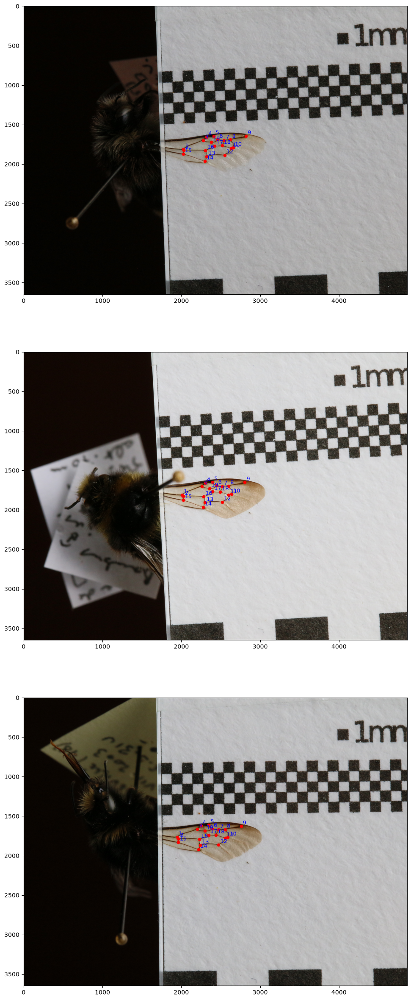

In [ ]:
n = 3
fig, axes = plt.subplots(n, 1, figsize=(15, 10*n))

for i, spec in enumerate(specimens[:n]):
    image = cv2.imread(PROJECT_ROOT / spec.image_path)
    h, w = image.shape[:2]

    landmarks = spec.landmarks.copy()
    landmarks[:, 1] = h - landmarks[:, 1]

    axes[i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[i].scatter(landmarks[:,0], landmarks[:,1], 20, 'r')

    for j, (x, y) in enumerate(landmarks):
        axes[i].annotate(str(j + 1), (x, y), color="blue", fontsize=9,
            xytext=(3, 3), textcoords="offset points")

plt.show()

## Modèle Gabriel

In [5]:
orga_wings = pd.read_csv(LOGS_ROOT / 'organized_wings_log.csv')
terr_wings = pd.read_csv(LOGS_ROOT / 'terrain_wings_log.csv')

In [63]:
def get_image(row):
    split = row.image.split('_')
    if len(split) < 4:
        return row.image
    return row.image[:-2]

idmb = pd.read_csv(PROJECT_ROOT / 'data' / 'images' / 'wide' / 'terrain' / 'Doc_bourdon_IDMB.csv')
idmb.rename(columns={"Numéro d'inventaire": 'image', 'sp': 'espece'}, inplace=True)
idmb['espece'] = idmb["espece"].str.lower()
idmb = idmb.set_index("image")["espece"]

valids = terr_wings.loc[terr_wings.status == 'OK'].reset_index()
valids['image'] = valids.apply(get_image, axis=1)
valids = valids.join(idmb, on='image')[['image', 'espece', 'output_path']]
valids['caste'] = '_'
valids['device'] = 'D1'
valids[["image", "espece", "caste", "device"]].to_csv(METADATAS_OUT, index_label="id") 

In [ ]:
# def fix_image(row):
#     return Path(row["image"]).stem

# def get_species(row):
#     try:
#         sp = row["input_path"].split('\\')[-3].split('_')[1]
#     except:
#         sp = row["input_path"].split('\\')[-3]
#     return sp

# def get_caste(row):
#     return row["input_path"].split('\\')[-2]

# def get_device(row):
#     return row["image"].split('_')[-1]

# valids = orga_wings.loc[orga_wings.status == 'OK']
# valids["image"] = valids.apply(fix_image, axis=1)
# valids["espece"] = valids.apply(get_species, axis=1)
# valids["caste"] = valids.apply(get_caste, axis=1)
# valids["device"] = valids.apply(get_device, axis=1)

# # unkown = valids[~valids.caste.isin(["male", "queen", "worker"])]
# valids = valids[valids.caste.isin(["male", "queen", "worker"])].reset_index()
# # valids[["image", "espece", "caste", "device"]].to_csv(METADATAS_OUT, index_label="id") 

In [16]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

model_name = "UNet_150_epoch_lr=0.001_seed=58_func=pow_param=30"
model_load = torch.load(MODEL_DIR / (model_name + '.pth'),
                        weights_only=False, map_location=device)
model_load.to(device)
model_load.eval()

print("using", device)

using cuda


In [17]:
records = []
total = valids.shape[0]

for i, row in tqdm(valids.iterrows(), total=total):
    path = PROJECT_ROOT / row.output_path

    crop = cv2.imread(path)
    crop = cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)

    crop_t = torch.Tensor(crop.transpose(2,0,1)/255).unsqueeze(0)
    crop_t = crop_t.to(device)

    output = model_load(crop_t).cpu().squeeze(0).detach().numpy().transpose(1,2,0)
    output = output.squeeze(axis = 2)

    maximas = np.argwhere(local_maxima(output) == True)
    
    scores = np.array([output[pt[0],pt[1]] for pt in maximas])
    sorter = np.argsort(scores)
    
    maximas = maximas[sorter,:]
    maximas = maximas[-18:,:]

    records.append({
        "landmarks": maximas,
        "image_path": path,
        "specimen_id": i,
    })

  0%|          | 0/289 [00:00<?, ?it/s]

In [18]:
with open(LANDMARKS_OUT, "w", encoding="utf-8") as f:
    for rec in records:
        lm = rec["landmarks"]
        f.write(f"LM={len(lm)}\n")
        for y, x in lm:
            f.write(f"{x:.4f} {y:.4f}\n")
        f.write(f"IMAGE={rec['image_path']}\n")
        f.write(f"ID={rec['specimen_id']}\n")

In [19]:
sample_indices = np.random.choice(total, size=min(10, total), replace=False)

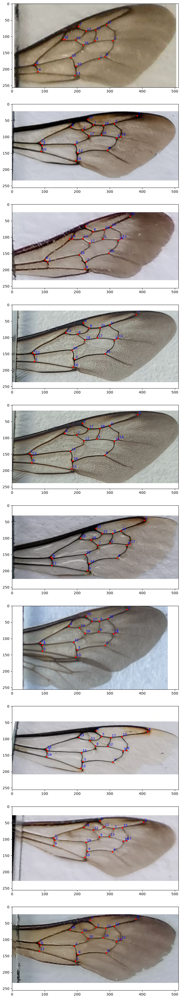

In [20]:
fig, axes = plt.subplots(10, 1, figsize=(10, 50))

for i, idx in enumerate(sample_indices):
    d = records[idx]
    
    image = cv2.imread(d["image_path"])
    landmarks = d["landmarks"]

    axes[i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[i].scatter(landmarks[:,1], landmarks[:,0], 10, 'r')

    for j, (y, x) in enumerate(landmarks):
        axes[i].annotate(str(j + 1), (x, y), color="blue", fontsize=9,
            xytext=(3, 3), textcoords="offset points")

plt.show()

In [67]:
outliers = pd.read_csv(PROJECT_ROOT / 'src' / 'out' / 'lda' / 'terrain' / 'outlier_specimens.csv', index_col=0)
outliers_idx = outliers[outliers.heavy].index

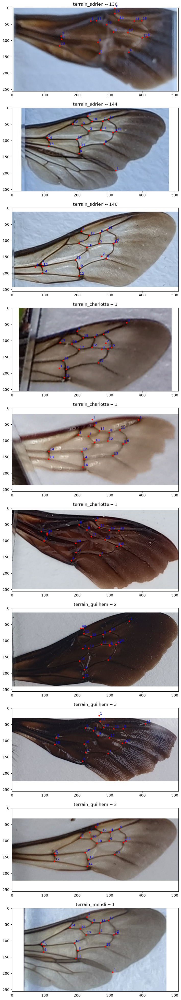

In [68]:
fig, axes = plt.subplots(10, 1, figsize=(10, 50))

for i, idx in enumerate(outliers_idx[:10]):
    d = records[idx]

    img_path = Path(d["image_path"])
    
    image = cv2.imread(img_path)
    landmarks = d["landmarks"]

    axes[i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[i].scatter(landmarks[:,1], landmarks[:,0], 10, 'r')

    for j, (y, x) in enumerate(landmarks):
        axes[i].annotate(str(j + 1), (x, y), color="blue", fontsize=9,
            xytext=(3, 3), textcoords="offset points")
    
    esp = img_path.parents[1].stem.split("_")[-1]
    cst = img_path.parents[0].stem
    device = Path(img_path).stem.split("_")[-1]
    axes[i].set_title(f"{esp}_{cst} -- {device}")

plt.show()

In [ ]:
# datas = pd.read_csv(PROJECT_ROOT / 'data' / 'annotations' / 'gabriel.csv', index_col=0)
# preds = pd.read_csv(PROJECT_ROOT / 'src' / 'out' / 'lda' / 'organized' / 'predictions.csv', index_col=0)

In [64]:
datas = pd.read_csv(PROJECT_ROOT / 'data' / 'annotations' / 'terrain.csv', index_col=0)
preds = pd.read_csv(PROJECT_ROOT / 'src' / 'out' / 'lda' / 'terrain' / 'predictions_2.csv', index_col=0)

In [65]:
X = datas.loc[preds.index, ['espece']]
y = preds.loc[:, ['predicted_espece', 'second_choice']]

In [ ]:
comparison = pd.DataFrame({
    'true_espece': X['espece'],
    'predicted_espece': y['predicted_espece'],
    'second_choice': y['second_choice'],
    'top1_match': X['espece'] == y['predicted_espece']
})
comparison['top2_match'] = (comparison['true_espece'] == comparison['predicted_espece']) | \
                           (comparison['true_espece'] == comparison['second_choice'])

print("=== RÉSUMÉ DES PRÉDICTIONS ===")
top1_accuracy = comparison['top1_match'].sum() / len(comparison)
top2_accuracy = comparison['top2_match'].sum() / len(comparison)

print(f"Top-1 Accuracy: {top1_accuracy:.4f} ({top1_accuracy*100:.2f}%)")
print(f"Top-2 Accuracy: {top2_accuracy:.4f} ({top2_accuracy*100:.2f}%)")

print(f"\n=== ERREURS TOP-1 ({(~comparison['top1_match']).sum()} erreurs) ===")
print(comparison[~comparison['top1_match']].head(10))

print(f"\n=== ERREURS TOP-2 ({(~comparison['top2_match']).sum()} erreurs) ===")
print(comparison[~comparison['top2_match']].head(10))

=== RÉSUMÉ DES PRÉDICTIONS ===
Top-1 Accuracy: 0.8929 (89.29%)
Top-2 Accuracy: 0.9167 (91.67%)

=== ERREURS TOP-1 (27 erreurs) ===
    true_espece            predicted_espece               second_choice  \
id                                                                        
0     rupestris                    confusus                   wurflenii   
8      pratorum                   wurflenii  sp (wurflenii ou pratorum)   
54    monticola                    confusus                    pratorum   
55    pyrenaeus  sp (wurflenii ou pratorum)                    pratorum   
68    rupestris                   wurflenii                  lapidarius   
74   soroeensis                   wurflenii                  soroeensis   
75   soroeensis                   wurflenii                  soroeensis   
84    rupestris                  ruderarius                    sylvarum   
94    rupestris  sp (wurflenii ou pratorum)                   rupestris   
103   pyrenaeus                  lapidarius 

In [54]:
sample_indices = preds.loc[preds.confidence < 0.6].index

In [55]:
specimens = parse_tps('../data/annotations/terrain_reordered.tps')[0]

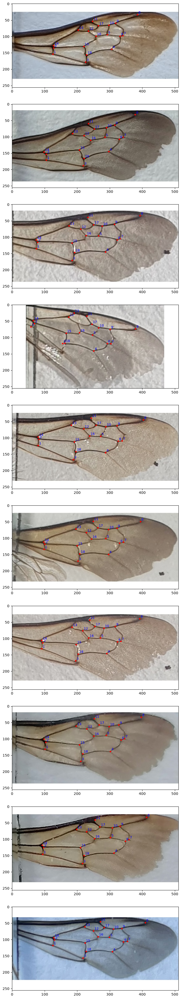

In [56]:
fig, axes = plt.subplots(10, 1, figsize=(10, 50))

for i, idx in enumerate(sample_indices[:10]):
    spec = specimens[idx]
    
    image = cv2.imread(spec.image_path)
    landmarks = spec.landmarks

    axes[i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[i].scatter(landmarks[:,0], landmarks[:,1], 10, 'r')

    for j, (x, y) in enumerate(landmarks):
        axes[i].annotate(str(j + 1), (x, y), color="blue", fontsize=9,
            xytext=(3, 3), textcoords="offset points")

plt.show()